In [54]:
import shap
import cv2
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from  matplotlib.colors import LinearSegmentedColormap
import copy
%matplotlib inline
import skimage.segmentation
from sklearn.linear_model import LinearRegression
from skimage.color import gray2rgb
import os
from PIL import Image
import joblib

In [55]:
from skimage.io import imread
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure
from skimage.color import rgb2gray
import matplotlib.pylab as plt

In [56]:
import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import ipyplot

input_img = imageio.imread('xai_thyroid/Data/datapre/108_1.jpg')
rot1 = iaa.Affine(rotate=(-90))
input_rot1 = rot1.augment_image(input_img)
# images_list=[input_img, input_rot1]
# labels = ['Original', 'Rotated Image']
# ipyplot.plot_images(images_list,labels=labels,img_width=180)

In [57]:
dataframe = pd.read_csv("xai_thyroid/Data/labels.csv", encoding='utf-8')
dataframe = dataframe[:480]
# print(dataframe)

dataset = []
for i in range(len(dataframe)):
    if dataframe["Cla1"][i]==0:
        continue
    row_data = []
    
    for row in dataframe:
        row_data.append(dataframe[row][i])
    dataset.append(row_data)

dataset

[['2_1', 1, '2'],
 ['3_1', 2, '4a'],
 ['4_1', 2, '4a'],
 ['5_1', 2, '5'],
 ['6_1', 2, '4b'],
 ['7_1', 2, '4a'],
 ['8_1', 2, '4c'],
 ['9_1', 2, '4b'],
 ['10_1', 2, '4b'],
 ['11_1', 2, '5'],
 ['12_1', 2, '4a'],
 ['13_1', 2, '4a'],
 ['14_1', 1, '2'],
 ['15_1', 2, '4c'],
 ['16_1', 1, '3'],
 ['17_1', 1, '2'],
 ['18_1', 2, '4a'],
 ['19_1', 2, '5'],
 ['20_1', 2, '4b'],
 ['21_1', 2, '4a'],
 ['22_1', 1, '2'],
 ['23_1', 2, '4a'],
 ['24_1', 2, '4b'],
 ['25_1', 1, '3'],
 ['26_1', 2, '4a'],
 ['27_1', 2, '4b'],
 ['28_1', 2, '4b'],
 ['29_1', 2, '5'],
 ['30_1', 2, '4c'],
 ['31_1', 1, '3'],
 ['32_1', 2, '4a'],
 ['33_1', 2, '4a'],
 ['34_1', 2, '4c'],
 ['35_1', 2, '4b'],
 ['36_1', 2, '5'],
 ['38_1', 2, '4b'],
 ['39_1', 2, '4a'],
 ['40_1', 2, '4a'],
 ['41_1', 2, '4b'],
 ['42_1', 2, '4b'],
 ['43_1', 2, '4c'],
 ['44_1', 2, '4a'],
 ['45_1', 2, '4b'],
 ['46_1', 2, '5'],
 ['47_1', 2, '4a'],
 ['48_1', 2, '4b'],
 ['49_1', 2, '4a'],
 ['50_1', 2, '4a'],
 ['51_1', 1, '2'],
 ['52_1', 2, '4a'],
 ['53_1', 2, '4c'],
 [

In [58]:
# path = 'xai_thyroid/Data/datapre/' + "108_1" + '.jpg'
# img = imread(path)
# img=gray2rgb(img)
# # print(len(features_of_single_image(img)))

# # Load an image
# image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

# # Create a SIFT object
# sift = cv2.SIFT_create()

# # Detect keypoints and compute descriptors
# keypoints, descriptors = sift.detectAndCompute(image, None)
# print(descriptors)
# # Draw keypoints on the image
# image_with_keypoints = cv2.drawKeypoints(image, keypoints, None)
# print(image_with_keypoints.shape)

# # Save or display the image with keypoints
# cv2.imwrite('image_with_keypoints.jpg', image_with_keypoints)

In [77]:
import os
import time
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from scipy.fftpack import dct

def features_of_single_image(I):
#     image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = I
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(image, None)
    if descriptors is None:
        descriptors = np.array([np.zeros(128)])
    fixed_length = 3000
    if descriptors.shape[0] < fixed_length:
        padding = np.zeros((fixed_length - descriptors.shape[0], descriptors.shape[1]), dtype=np.float32)
        descriptors = np.vstack((descriptors, padding))
    elif descriptors.shape[0] > fixed_length:
        descriptors = descriptors[:fixed_length]
        
    flattened = descriptors.ravel()
    return flattened


path = 'xai_thyroid/Data/datapre/' + "108_1" + '.jpg'
img = imread(path)
img=gray2rgb(img)
print(len(features_of_single_image(img)))

384000


In [60]:
path = 'xai_thyroid/Data/datapre/' + "108_1" + '.jpg'
img = imread(path)
img=gray2rgb(img)
print(img)
features_of_single_image(img)

[[[  0   0   0]
  [ 10  10  10]
  [189 189 189]
  ...
  [  2   2   2]
  [  1   1   1]
  [  0   0   0]]

 [[  0   0   0]
  [115 115 115]
  [253 253 253]
  ...
  [  3   3   3]
  [ 10  10  10]
  [ 12  12  12]]

 [[ 62  62  62]
  [255 255 255]
  [255 255 255]
  ...
  [119 119 119]
  [108 108 108]
  [155 155 155]]

 ...

 [[  6   6   6]
  [  8   8   8]
  [ 55  55  55]
  ...
  [110 110 110]
  [125 125 125]
  [144 144 144]]

 [[  0   0   0]
  [  0   0   0]
  [ 47  47  47]
  ...
  [ 87  87  87]
  [ 97  97  97]
  [109 109 109]]

 [[  9   9   9]
  [  6   6   6]
  [ 59  59  59]
  ...
  [116 116 116]
  [106 106 106]
  [105 105 105]]]


array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

In [61]:
path = 'xai_thyroid/Data/datapre/' + "3_1" + '.jpg'
img = imread(path)
img=gray2rgb(img)
print(img)
features_of_single_image(img)

[[[ 74  74  74]
  [139 139 139]
  [ 10  10  10]
  ...
  [  0   0   0]
  [  0   0   0]
  [  3   3   3]]

 [[219 219 219]
  [242 242 242]
  [133 133 133]
  ...
  [115 115 115]
  [106 106 106]
  [ 95  95  95]]

 [[255 255 255]
  [255 255 255]
  [238 238 238]
  ...
  [203 203 203]
  [199 199 199]
  [183 183 183]]

 ...

 [[ 30  30  30]
  [171 171 171]
  [174 174 174]
  ...
  [ 62  62  62]
  [ 51  51  51]
  [ 39  39  39]]

 [[ 29  29  29]
  [147 147 147]
  [154 154 154]
  ...
  [ 22  22  22]
  [ 15  15  15]
  [  8   8   8]]

 [[  0   0   0]
  [ 75  75  75]
  [ 71  71  71]
  ...
  [ 39  39  39]
  [ 32  32  32]
  [ 24  24  24]]]


array([102.,  39.,   0., ...,   0.,   0.,   0.], dtype=float32)

In [62]:
X = []
Y = []
count = 0
for row in dataset:
    path = 'xai_thyroid/Data/datapre/' + row[0] + '.jpg'
    img = imread(path)
    img=gray2rgb(img)
    X.append(features_of_single_image(img))
    Y.append(row[1])
        
    count=count+1
    print(count)
    
print(len(X))

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [63]:
X[0]

array([52., 20., 73., ...,  0.,  0.,  0.], dtype=float32)

In [64]:
for i in range(len(X)):
    print(len(X[i]))

384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000
384000

In [65]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()
X_n,Y_n=smt.fit_resample(X,Y)

In [66]:
print(len(X_n))
print(len(Y_n))
X=X_n
Y=Y_n

576
576


In [67]:
x1=x2=0
for x in Y_n:
    if(x==1):
        x1=x1+1
    if(x==2):
        x2=x2+1
print(x1," ",x2)

288   288


In [68]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y ,
                                   random_state=104, 
                                   test_size=0.2, 
                                   shuffle=True)
print(len(X_train))
print(len(X_test))

460
116


In [69]:
# import support vector classifier 
# "Support Vector Classifier"
from sklearn.svm import SVC  
clf = SVC(kernel='linear') 
  
# fitting x samples and y classes 
clf.fit(X_train,Y_train) 

SVC(kernel='linear')

In [70]:
count =0
for i in range(len(X_test)):
    ans=clf.predict([X_test[i]])
    if(ans[0]!=Y_test[i]):
        print(i, " ", ans[0], " ", Y_test[i])
        count += 1
count

0

In [71]:
print(len(X[0]))

384000


In [72]:
import matplotlib
import math



def test_with_single_input_7200_hot_shap(images):
    #image=skimage.io.imread(image,format='jpeg')
    num_imgs=len(images)
    result=np.zeros((num_imgs,2))
    for i in range(num_imgs):
        image=images[i]
#         print(image)
#         image = matlab.double(image.tolist())
        res=features_of_single_image(image)
        label = clf.predict([res])
#         [label,score] = eng.return_probs_hog(res,nargout=2)
#         label = clf.predict([res])
#         temp=np.asarray(score)
        if(label==1):
            result[i][0]=1
        else:
            result[i][1]=1
    return result

path = 'xai_thyroid/Data/datapre/' + "3_1" + '.jpg'
img = imread(path)
img=gray2rgb(img)
print(img.shape)
print(test_with_single_input_7200_hot_shap([img]))
res=features_of_single_image(img)
label = clf.predict([res])
label

(300, 300, 3)
[[0. 1.]]


array([2])

In [73]:
import math
a = np.random.rand()*2
math.ceil(a)

1

In [78]:
images = ['51_1']
filename = images[0]
# for filename in images:
pathname = r'C:/Users/tayal/Desktop/Projects/BTP Project/survey XAI/proj/proj/xai_thyroid/Data/datapre/' + filename + '.jpg'
X=matplotlib.image.imread(pathname)
# print(X)
X=gray2rgb(X)
# X=np.reshape(X,(1,300,300,3))
# X=X.astype(np.float64)
 
ans=test_with_single_input_7200_hot_shap([X])
print(ans)
        
    
print(X.shape)
res=test_with_single_input_7200_hot_shap([X])
masker = shap.maskers.Image("inpaint_telea", X.shape)
# explainer = shap.Explainer(clf)
# shap_values = explainer.shap_values(X)
explainer = shap.Explainer(test_with_single_input_7200_hot_shap, masker, output_names=['benign','malignant'])
shap_values = explainer(np.array([X]), max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:3])

# ex_filename = filename + '.bz2'
# joblib.dump(shap_values, filename=ex_filename, compress=('bz2', 9))
# shap_values1 = joblib.load(filename=ex_filename)

[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer: 2it [01:01, 61.19s/it]                                                                            


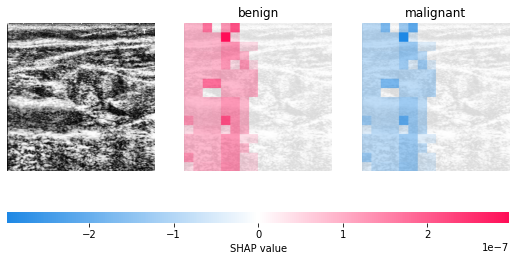

In [80]:
shap_values
shap.image_plot(shap_values/255)

[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:04, 64.68s/it]                                                                            


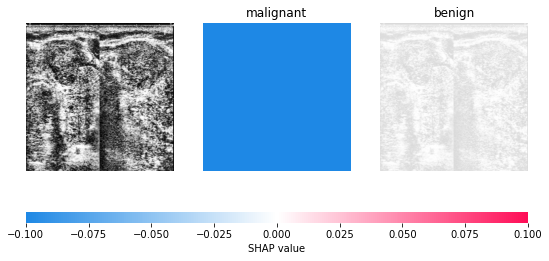

In [82]:
images = ['201_1']
filename = images[0]
# for filename in images:
pathname = r'C:/Users/tayal/Desktop/Projects/BTP Project/survey XAI/proj/proj/xai_thyroid/Data/datapre/' + filename + '.jpg'
X=matplotlib.image.imread(pathname)
# print(X)
X=gray2rgb(X)
# X=np.reshape(X,(1,300,300,3))
# X=X.astype(np.float64)
 
ans=test_with_single_input_7200_hot_shap([X])
print(ans)
        
    
print(X.shape)
res=test_with_single_input_7200_hot_shap([X])
masker = shap.maskers.Image("inpaint_telea", X.shape)
# explainer = shap.Explainer(clf)
# shap_values = explainer.shap_values(X)
explainer = shap.Explainer(test_with_single_input_7200_hot_shap, masker, output_names=['benign','malignant'])
shap_values = explainer(np.array([X]), max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:3])

# ex_filename = filename + '.bz2'
# joblib.dump(shap_values, filename=ex_filename, compress=('bz2', 9))
# shap_values1 = joblib.load(filename=ex_filename)
shap_values
shap.image_plot(shap_values/255)

[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:24, 84.56s/it]                                                                            


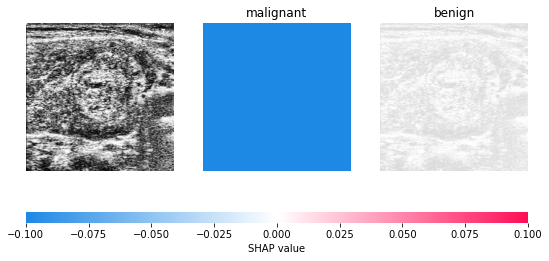

In [85]:
images = ['50_1']
filename = images[0]
# for filename in images:
pathname = r'C:/Users/tayal/Desktop/Projects/BTP Project/survey XAI/proj/proj/xai_thyroid/Data/datapre/' + filename + '.jpg'
X=matplotlib.image.imread(pathname)
# print(X)
X=gray2rgb(X)
# X=np.reshape(X,(1,300,300,3))
# X=X.astype(np.float64)
 
ans=test_with_single_input_7200_hot_shap([X])
print(ans)
        
    
print(X.shape)
res=test_with_single_input_7200_hot_shap([X])
masker = shap.maskers.Image("inpaint_telea", X.shape)
# explainer = shap.Explainer(clf)
# shap_values = explainer.shap_values(X)
explainer = shap.Explainer(test_with_single_input_7200_hot_shap, masker, output_names=['benign','malignant'])
shap_values = explainer(np.array([X]), max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:3])

# ex_filename = filename + '.bz2'
# joblib.dump(shap_values, filename=ex_filename, compress=('bz2', 9))
# shap_values1 = joblib.load(filename=ex_filename)
shap_values
shap.image_plot(shap_values/255)

[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:09, 69.17s/it]                                                                            


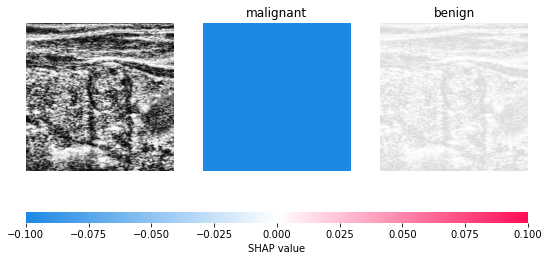

In [86]:
images = ['45_1']
filename = images[0]
# for filename in images:
pathname = r'C:/Users/tayal/Desktop/Projects/BTP Project/survey XAI/proj/proj/xai_thyroid/Data/datapre/' + filename + '.jpg'
X=matplotlib.image.imread(pathname)
# print(X)
X=gray2rgb(X)
# X=np.reshape(X,(1,300,300,3))
# X=X.astype(np.float64)
 
ans=test_with_single_input_7200_hot_shap([X])
print(ans)
        
    
print(X.shape)
res=test_with_single_input_7200_hot_shap([X])
masker = shap.maskers.Image("inpaint_telea", X.shape)
# explainer = shap.Explainer(clf)
# shap_values = explainer.shap_values(X)
explainer = shap.Explainer(test_with_single_input_7200_hot_shap, masker, output_names=['benign','malignant'])
shap_values = explainer(np.array([X]), max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:3])

# ex_filename = filename + '.bz2'
# joblib.dump(shap_values, filename=ex_filename, compress=('bz2', 9))
# shap_values1 = joblib.load(filename=ex_filename)
shap_values
shap.image_plot(shap_values/255)

1
2_1
2
3_1
3
4_1
4
5_1
5
6_1
6
7_1
7
8_1
8
9_1
9
10_1
10
11_1
11
12_1
12
13_1
13
14_1
14
15_1
15
16_1
16
17_1
17
18_1
18
19_1
19
20_1
20
21_1
21
22_1
22
23_1
23
24_1
24
25_1
25
26_1
26
27_1
27
28_1
28
29_1
29
30_1
30
31_1
31
32_1
32
33_1
33
34_1
34
35_1
35
36_1
36
38_1
37
39_1
38
40_1
39
41_1
40
42_1
41
43_1
42
44_1
43
45_1
44
46_1
45
47_1
46
48_1
47
49_1
48
50_1
49
51_1
50
52_1
51
53_1
52
54_1
53
55_1
54
56_1
55
57_1
56
61_1
57
65_1
58
65_2
59
66_1
60
67_1
61
68_1
62
70_1
63
73_1
64
74_1
65
76_1
66
78_1
67
79_1
68
80_1
69
80_2
70
81_1
71
81_2
72
82_1
73
83_1
74
85_1
75
85_2
76
86_1
77
88_1
78
88_2
79
89_1
80
90_1
81
90_2
82
91_1
83
93_1
84
93_2
85
94_1
86
95_1
87
98_1
88
100_1
89
101_1
90
102_1
91
103_1
92
105_1
93
107_1
94
108_1
95
109_1
96
110_1
97
111_1
98
112_1
99
113_1
100
115_1
101
118_1
102
119_1
103
121_1
104
122_1
105
122_2
106
123_1
107
125_1
108
126_1
109
127_1
110
128_1
111
129_1
112
129_2
113
130_1
114
130_2
115
131_1
116
134_1
117
135_1
118
137_1
119
141_1
120
142_1
121

  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:41, 101.21s/it]                                                                           


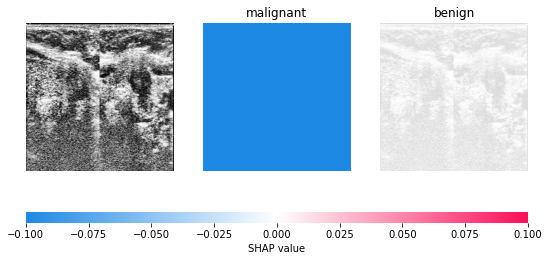

265
330_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:34, 94.88s/it]                                                                            


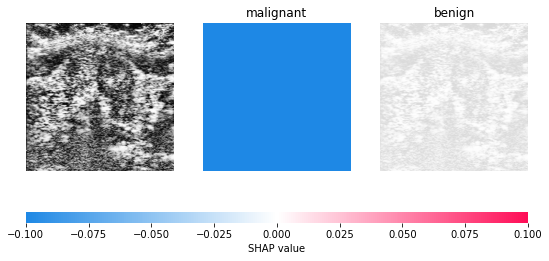

266
331_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:27, 87.44s/it]                                                                            


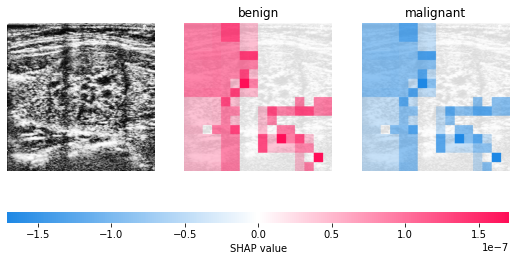

267
333_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:28, 88.72s/it]                                                                            


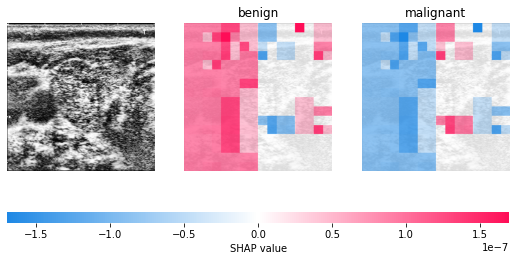

268
334_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:29, 89.14s/it]                                                                            


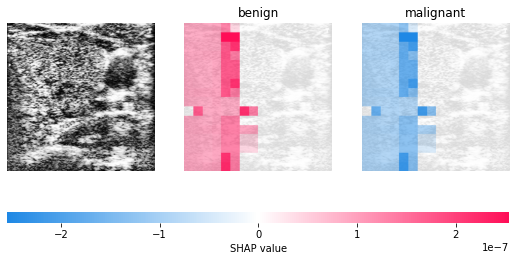

269
334_2
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:27, 87.30s/it]                                                                            


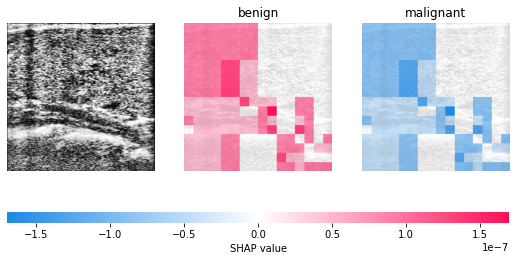

270
335_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:24, 84.19s/it]                                                                            


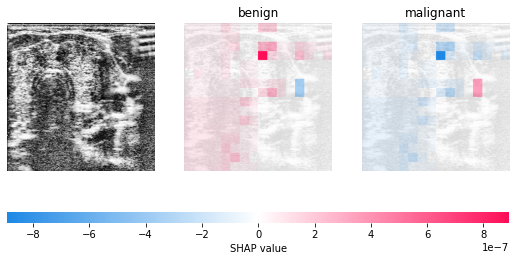

271
335_2
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:22, 82.50s/it]                                                                            


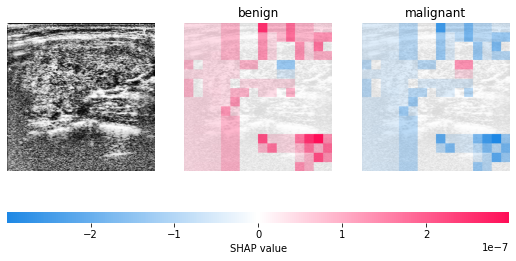

272
336_2
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:22, 82.60s/it]                                                                            


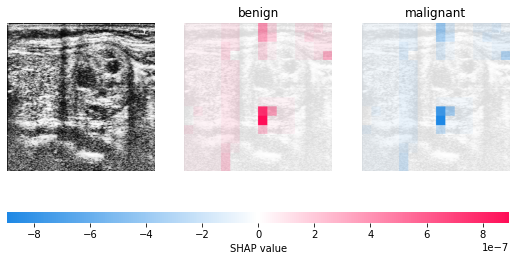

273
337_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:30, 90.16s/it]                                                                            


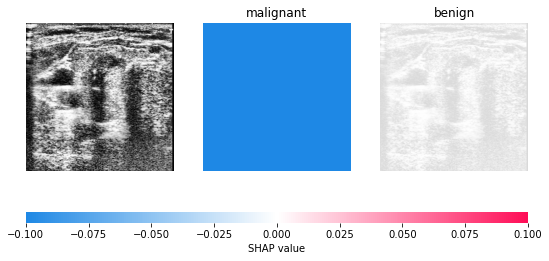

274
337_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:35, 95.91s/it]                                                                            


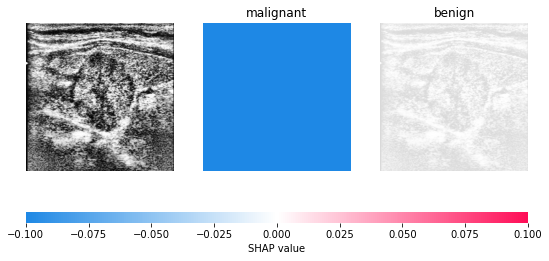

275
337_3
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:37, 97.69s/it]                                                                            


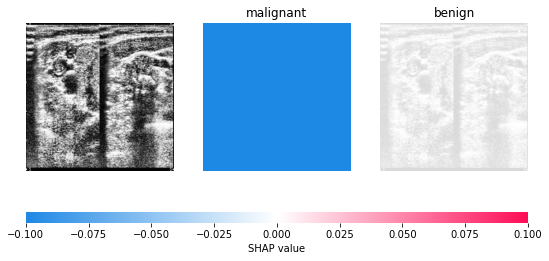

276
338_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:39, 99.21s/it]                                                                            


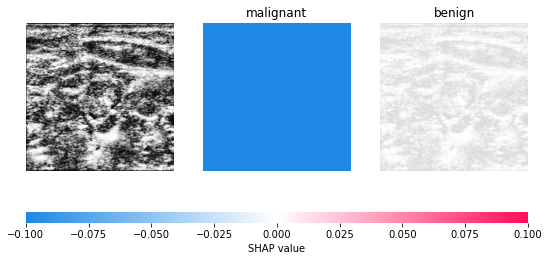

277
338_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:38, 98.86s/it]                                                                            


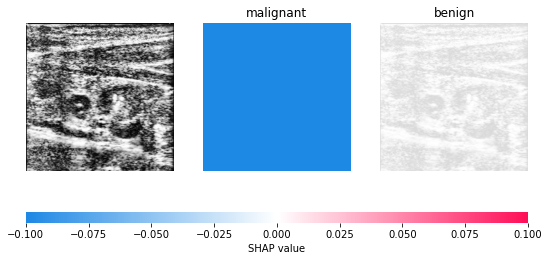

278
339_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:28, 88.06s/it]                                                                            


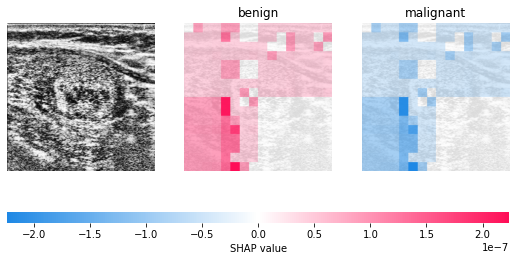

279
340_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:31, 91.82s/it]                                                                            


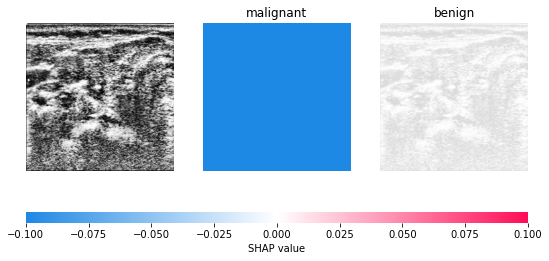

280
341_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:33, 93.28s/it]                                                                            


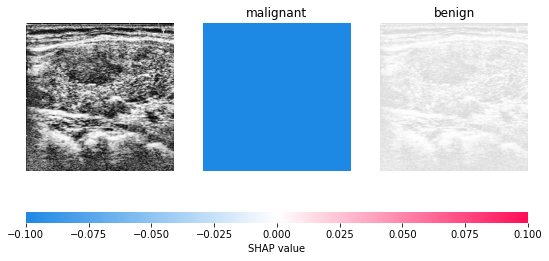

281
342_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:34, 94.29s/it]                                                                            


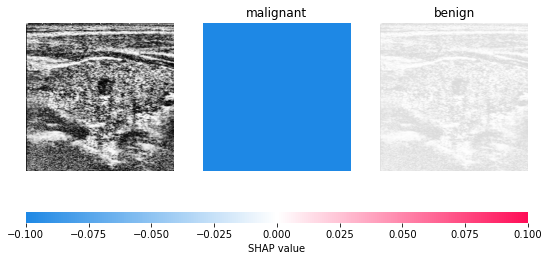

282
343_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:32, 92.23s/it]                                                                            


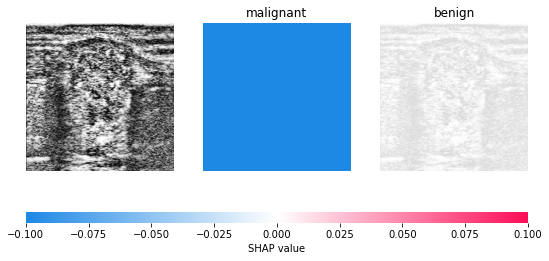

283
344_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:30, 90.79s/it]                                                                            


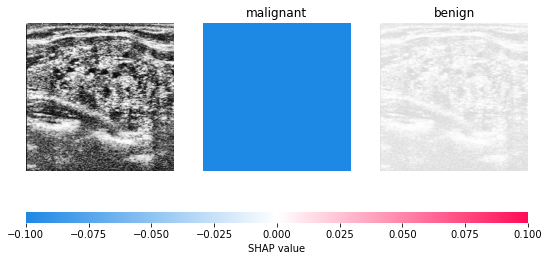

284
345_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:30, 90.91s/it]                                                                            


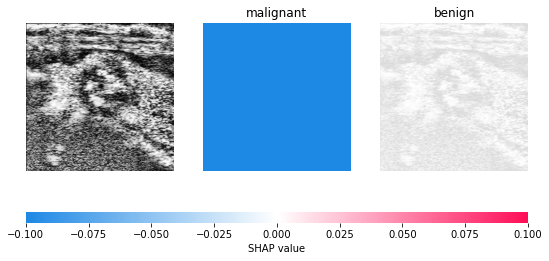

285
346_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:29, 89.27s/it]                                                                            


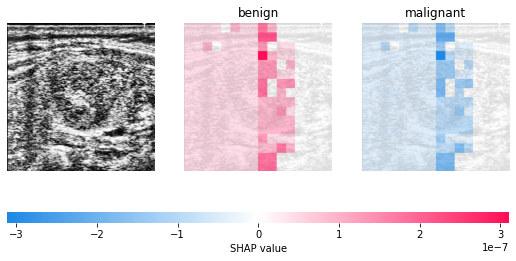

286
347_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:29, 89.11s/it]                                                                            


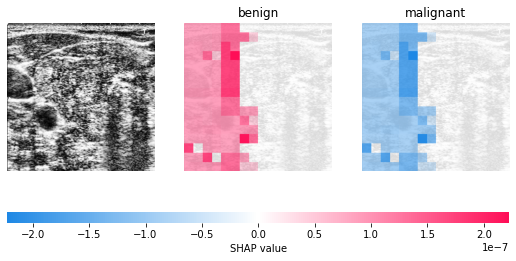

287
347_2
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:27, 87.65s/it]                                                                            


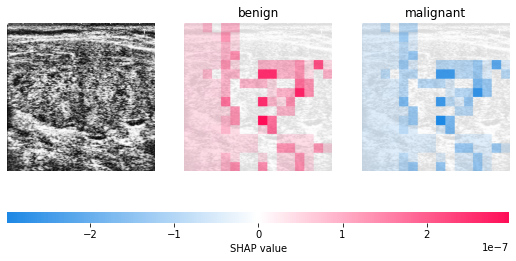

288
348_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:36, 96.28s/it]                                                                            


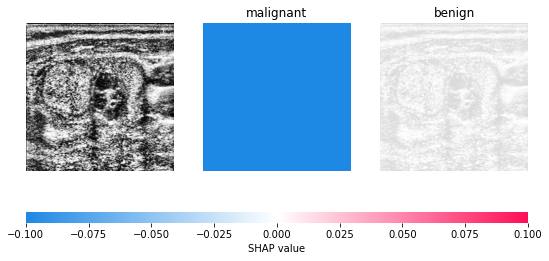

289
350_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:33, 93.92s/it]                                                                            


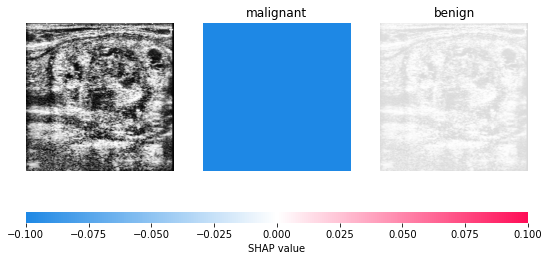

290
350_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:32, 92.63s/it]                                                                            


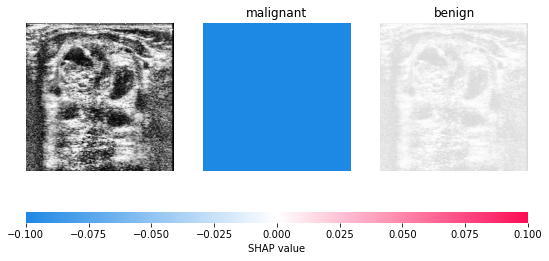

291
351_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:32, 92.75s/it]                                                                            


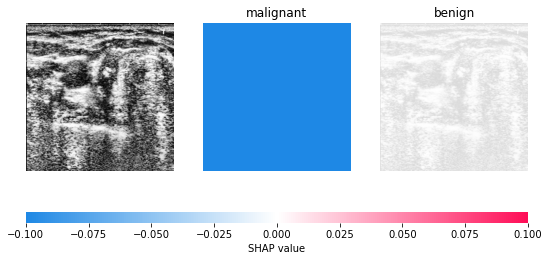

292
351_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:35, 95.98s/it]                                                                            


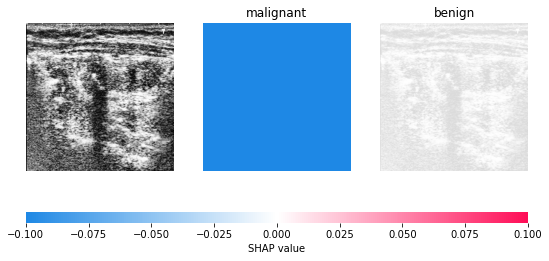

293
352_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:35, 95.76s/it]                                                                            


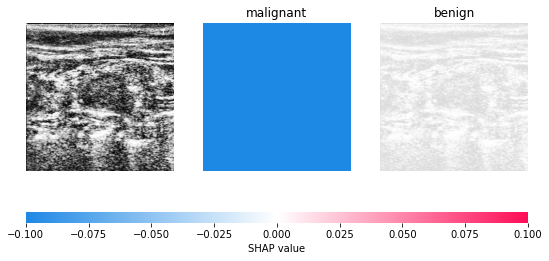

294
353_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:34, 94.82s/it]                                                                            


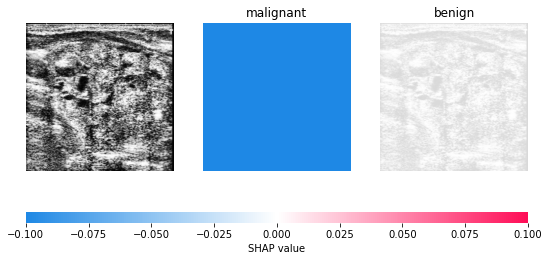

295
353_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:34, 94.97s/it]                                                                            


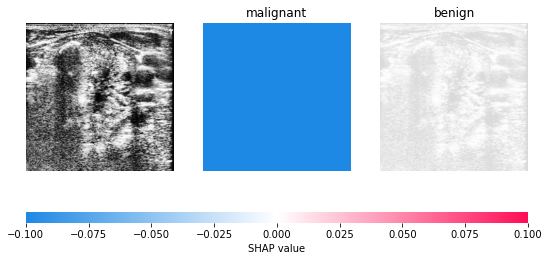

296
354_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:32, 92.54s/it]                                                                            


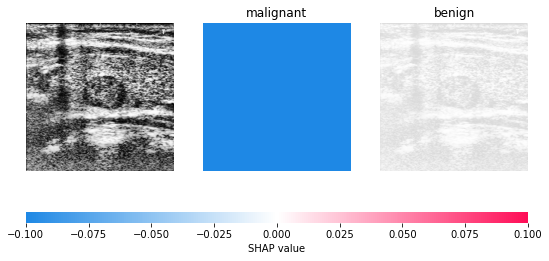

297
355_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:34, 94.31s/it]                                                                            


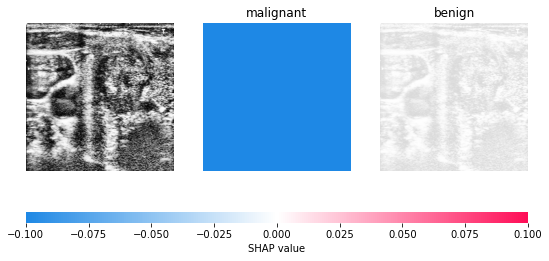

298
356_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:29, 89.11s/it]                                                                            


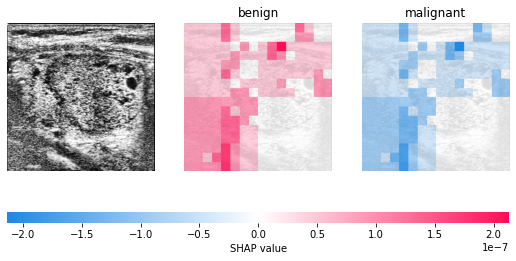

299
357_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:32, 92.03s/it]                                                                            


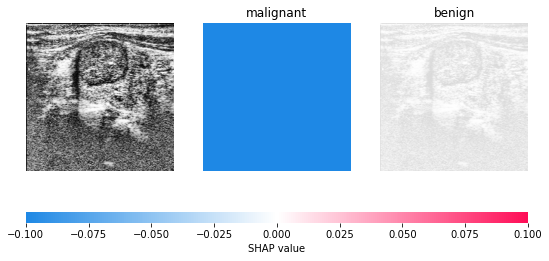

300
358_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:33, 93.10s/it]                                                                            


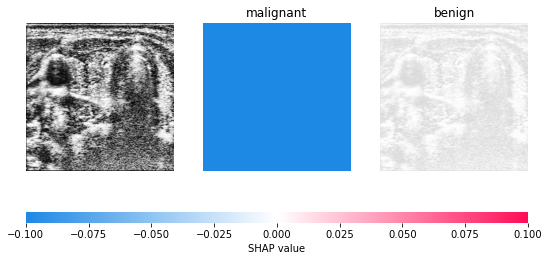

301
358_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:35, 95.72s/it]                                                                            


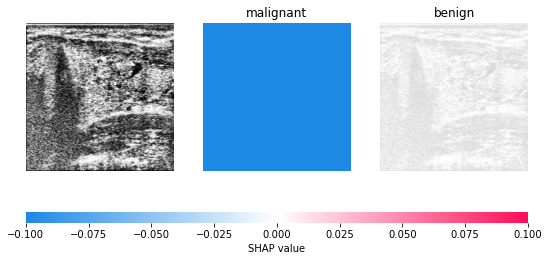

302
359_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:23, 83.94s/it]                                                                            


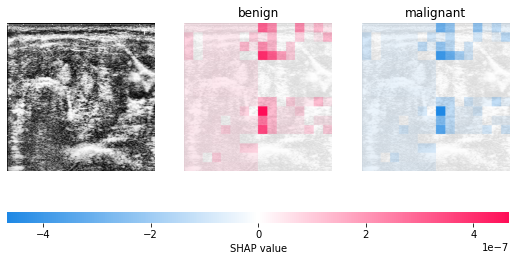

303
359_2
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:27, 87.26s/it]                                                                            


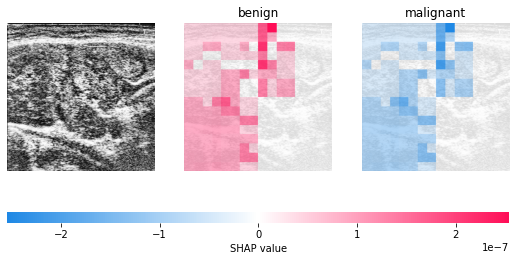

304
360_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:38, 98.86s/it]                                                                            


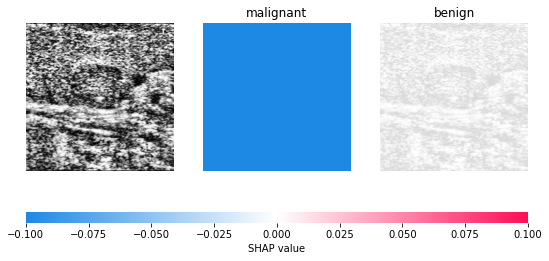

305
360_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:35, 95.01s/it]                                                                            


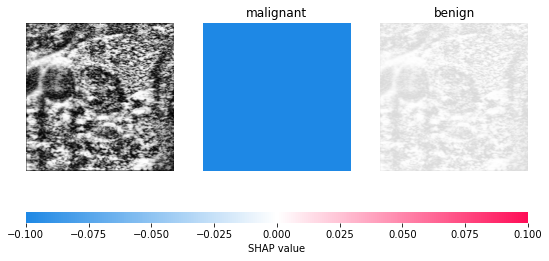

306
361_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:28, 88.80s/it]                                                                            


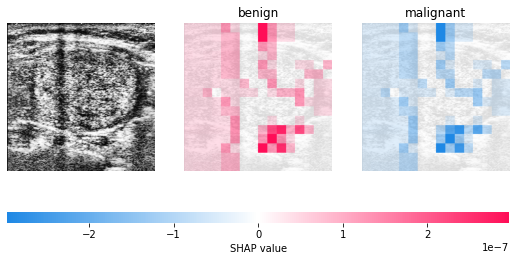

307
362_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:24, 84.66s/it]                                                                            


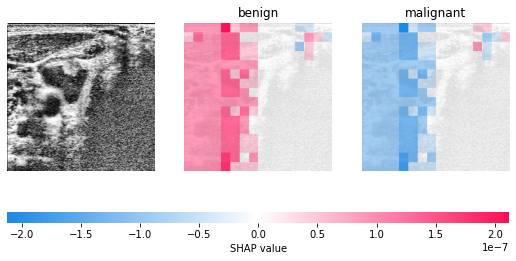

308
363_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:36, 96.74s/it]                                                                            


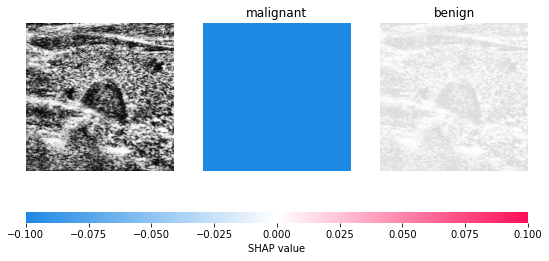

309
364_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:26, 86.63s/it]                                                                            


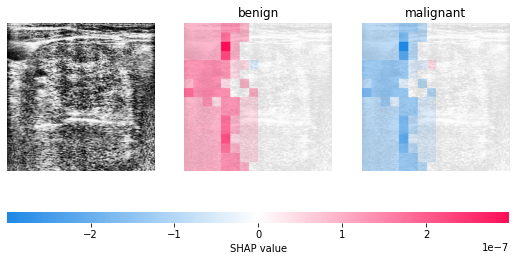

310
365_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:33, 93.61s/it]                                                                            


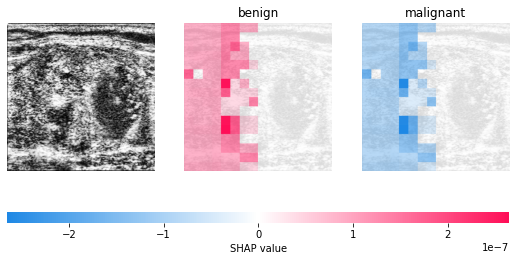

311
366_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:29, 89.69s/it]                                                                            


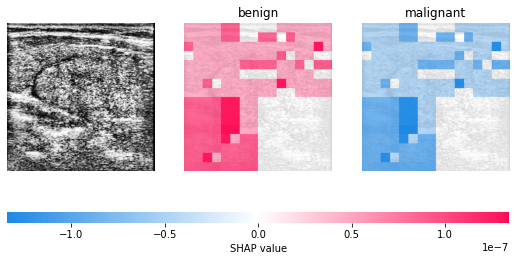

312
366_2
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:29, 89.37s/it]                                                                            


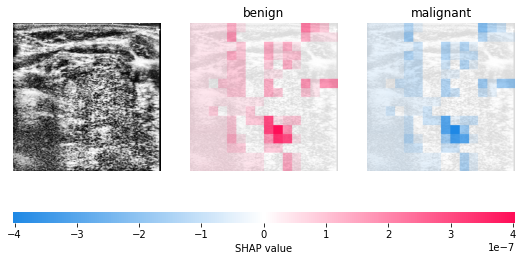

313
366_3
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:27, 87.87s/it]                                                                            


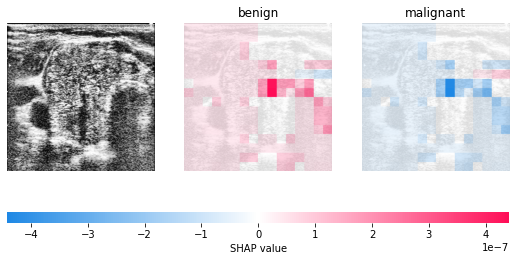

314
367_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:30, 90.95s/it]                                                                            


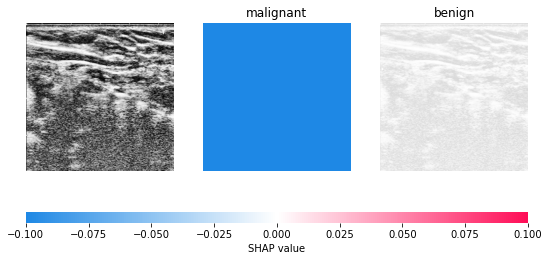

315
367_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:38, 98.86s/it]                                                                            


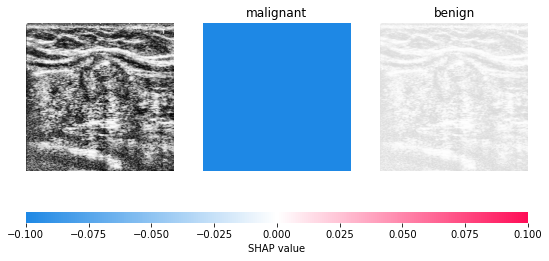

316
368_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:38, 98.60s/it]                                                                            


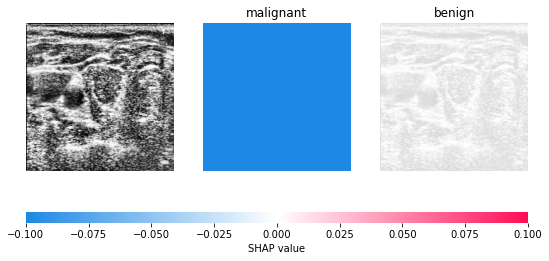

317
369_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:03, 63.90s/it]                                                                            


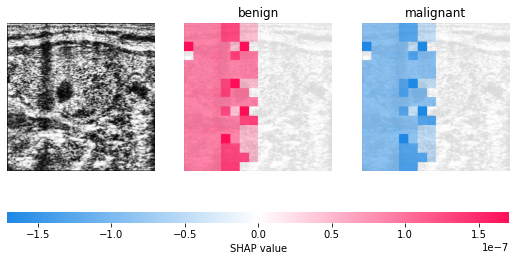

318
370_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [00:58, 58.37s/it]                                                                            


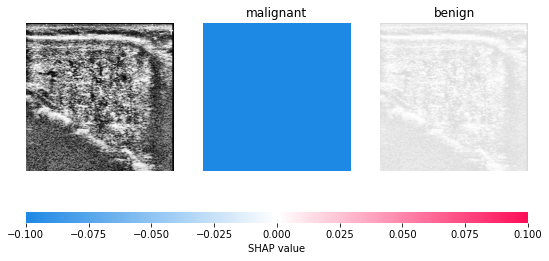

319
371_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:02, 62.49s/it]                                                                            


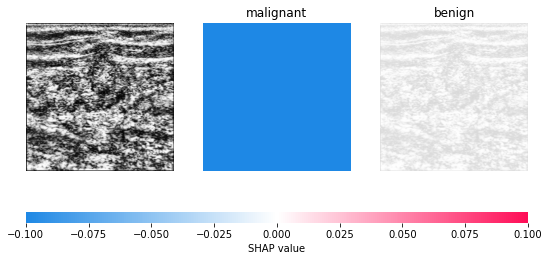

320
371_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:03, 63.93s/it]                                                                            


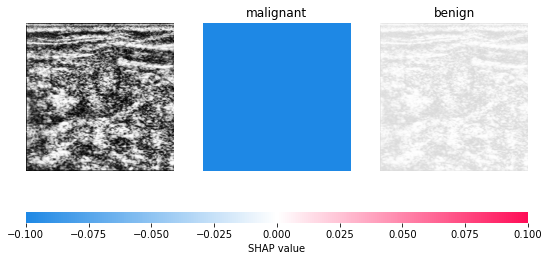

321
372_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:08, 68.72s/it]                                                                            


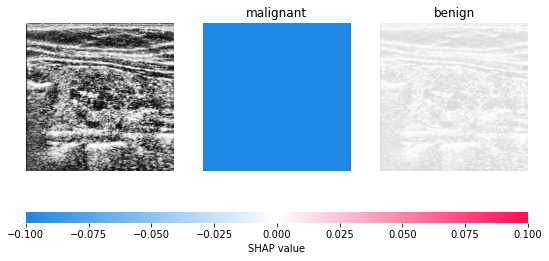

322
373_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:12, 72.91s/it]                                                                            


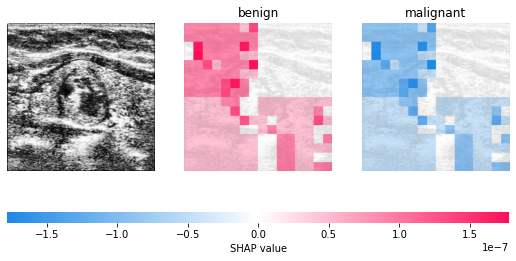

323
373_2
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:09, 69.68s/it]                                                                            


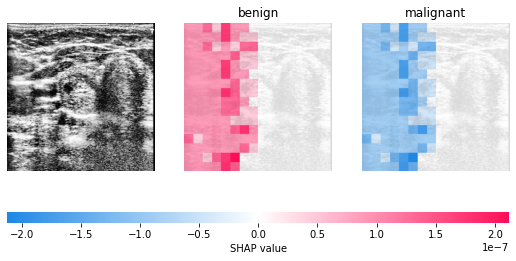

324
374_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [01:04, 64.64s/it]                                                                            


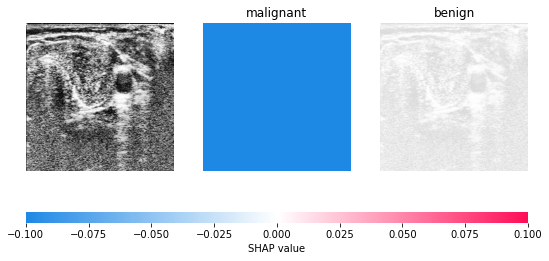

325
375_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [00:58, 58.73s/it]                                                                            


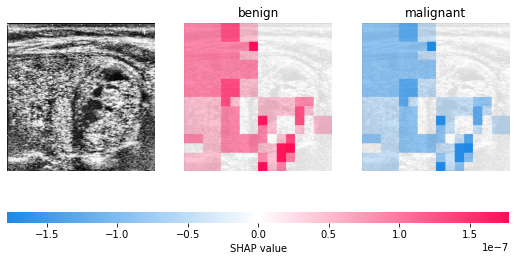

326
376_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [00:55, 55.70s/it]                                                                            


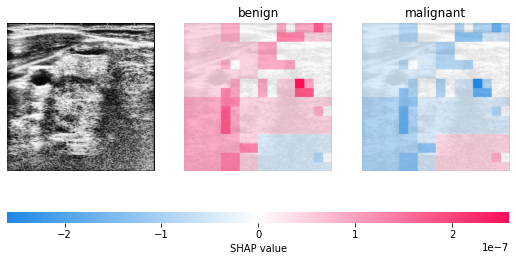

327
377_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [00:55, 55.82s/it]                                                                            


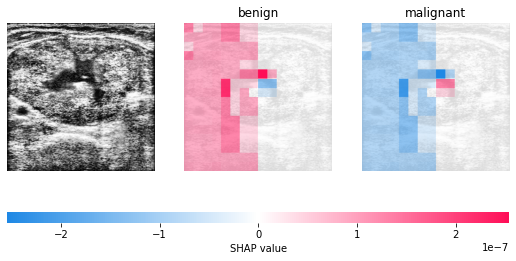

328
378_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]



Partition explainer: 2it [00:54, 54.92s/it]                                                                            


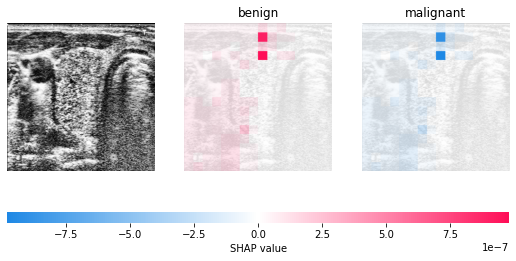

329
379_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [02:35, 155.74s/it]                                                                           


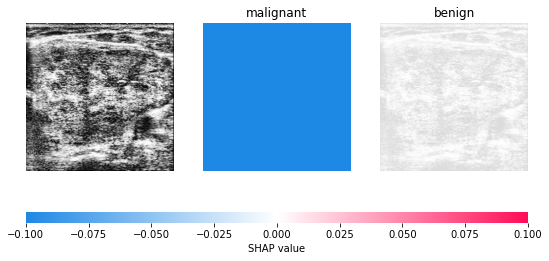

330
380_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:02, 62.09s/it]                                                                            


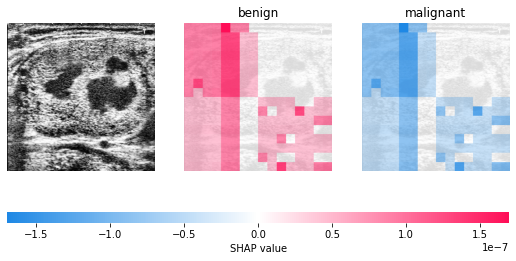

331
381_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:03, 63.73s/it]                                                                            


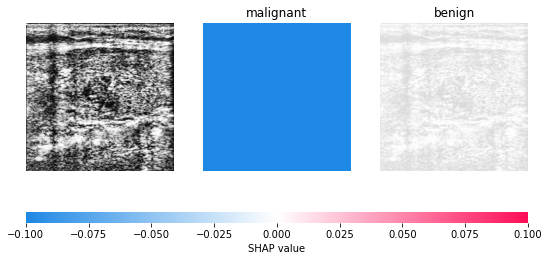

332
381_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:01, 61.66s/it]                                                                            


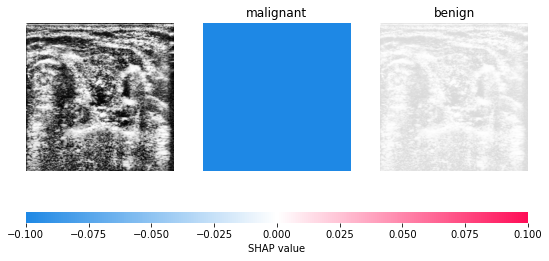

333
382_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:58, 58.33s/it]                                                                            


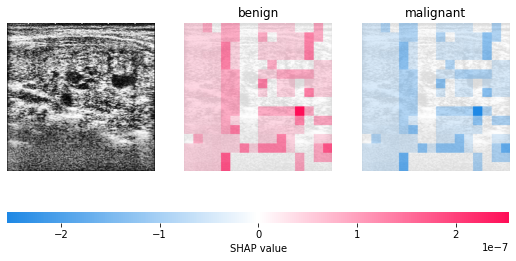

334
383_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:58, 58.40s/it]                                                                            


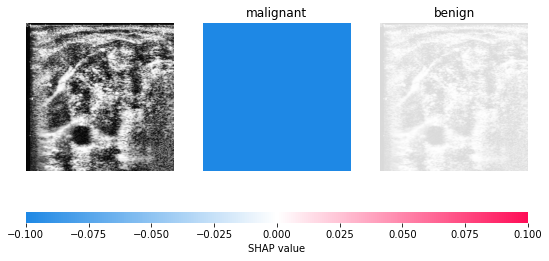

335
384_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:59, 59.46s/it]                                                                            


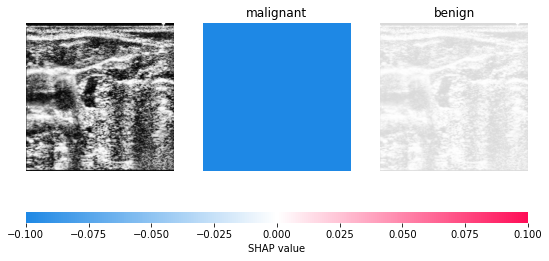

336
386_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:54, 54.99s/it]                                                                            


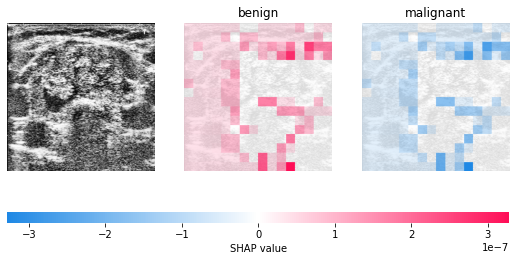

337
387_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:03, 63.71s/it]                                                                            


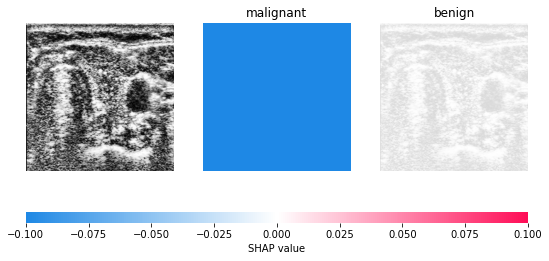

338
387_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:01, 61.79s/it]                                                                            


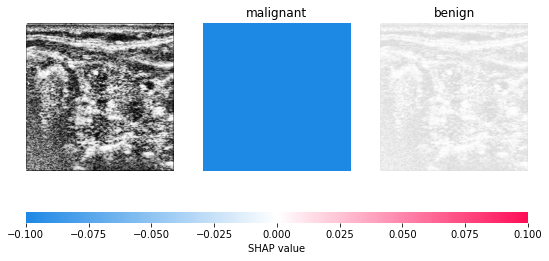

339
390_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:00, 60.94s/it]                                                                            


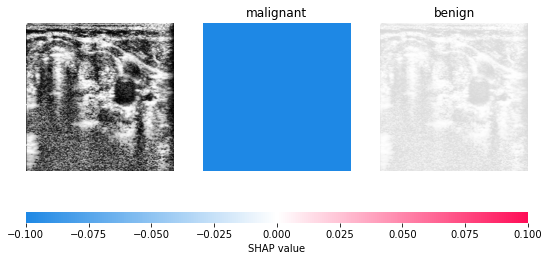

340
391_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:07, 67.43s/it]                                                                            


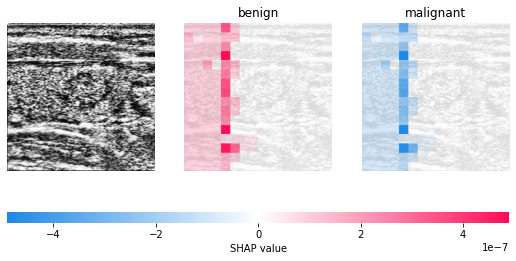

341
391_2
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:56, 56.79s/it]                                                                            


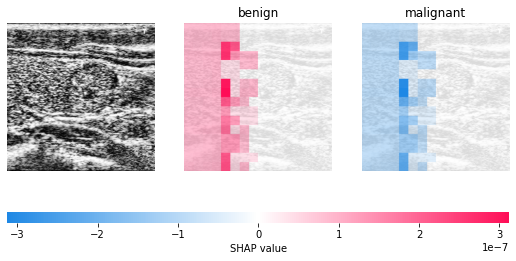

342
392_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:57, 57.90s/it]                                                                            


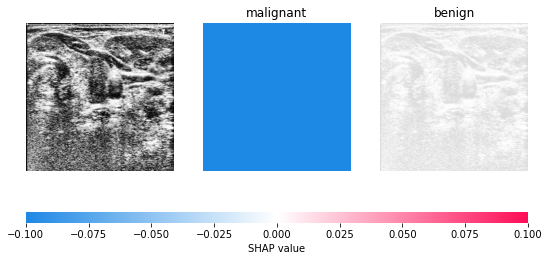

343
394_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:59, 59.82s/it]                                                                            


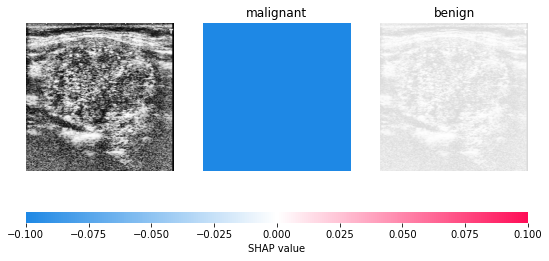

344
395_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:58, 58.43s/it]                                                                            


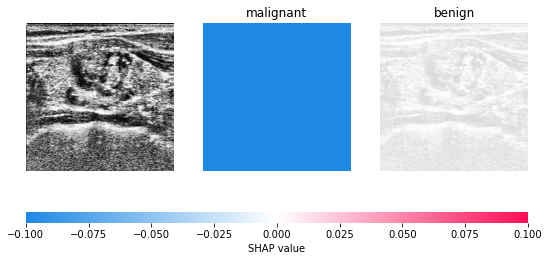

345
395_2
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:58, 58.97s/it]                                                                            


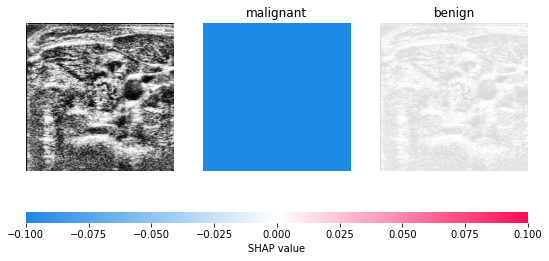

346
397_1
[[1. 0.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:59, 59.61s/it]                                                                            


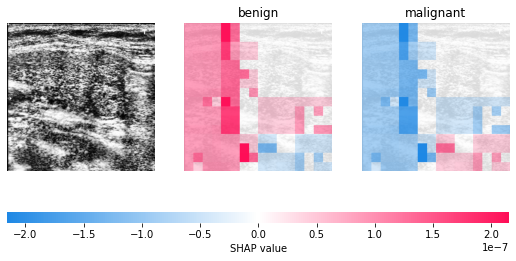

347
398_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:57, 57.53s/it]                                                                            


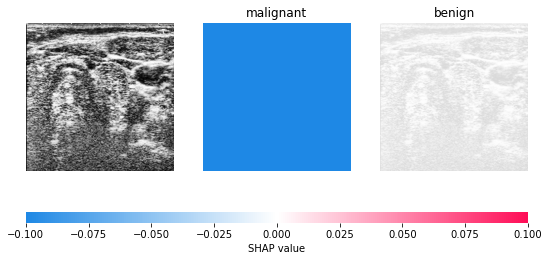

348
399_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [01:03, 63.68s/it]                                                                            


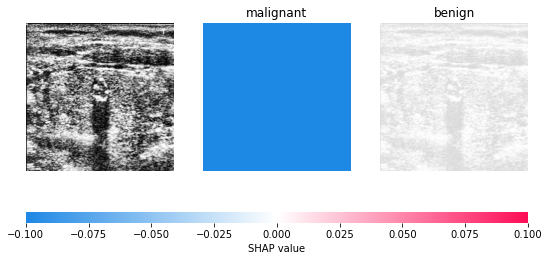

349
400_1
[[0. 1.]]
(300, 300, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 2it [00:59, 59.09s/it]                                                                            


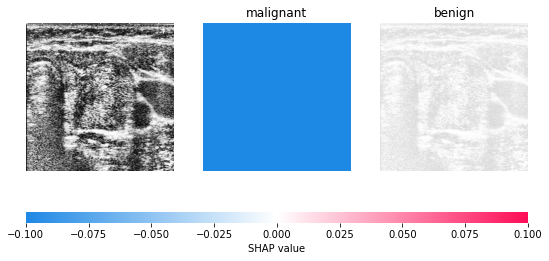

In [88]:
X = []
Y = []
count = 0
for row in dataset:
   
    count=count+1
    print(count)
    print(row[0])
    
    if count<264:
        continue
    
    filename=row[0]
    # for filename in images:
    pathname = r'C:/Users/tayal/Desktop/Projects/BTP Project/survey XAI/proj/proj/xai_thyroid/Data/datapre/' + filename + '.jpg'
    X=matplotlib.image.imread(pathname)
    # print(X)
    X=gray2rgb(X)
    # X=np.reshape(X,(1,300,300,3))
    # X=X.astype(np.float64)

    ans=test_with_single_input_7200_hot_shap([X])
    print(ans)


    print(X.shape)
    res=test_with_single_input_7200_hot_shap([X])
    masker = shap.maskers.Image("inpaint_telea", X.shape)
    # explainer = shap.Explainer(clf)
    # shap_values = explainer.shap_values(X)
    explainer = shap.Explainer(test_with_single_input_7200_hot_shap, masker, output_names=['benign','malignant'])
    shap_values = explainer(np.array([X]), max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:3])

    ex_filename = "SIFT-SVM Model Results/" + str(row[1]) + "/" + filename + '.bz2'
    joblib.dump(shap_values, filename=ex_filename, compress=('bz2', 9))
    shap_values1 = joblib.load(filename=ex_filename)
    shap_values
    shap.image_plot(shap_values/255)

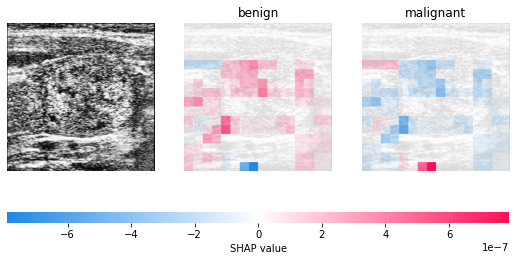

In [56]:
ex_filename = "DCT-SVM Model Results/1/" + "2_1" + '.bz2'
# joblib.dump(shap_values, filename=ex_filename, compress=('bz2', 9))
shap_values1 = joblib.load(filename=ex_filename)
shap.image_plot(shap_values1/255)